In [1]:
pip install tabulate


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import tabulate

from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from sklearn import cluster
from tensorflow import keras
from IPython.core.formatters import format_display_data
from matplotlib import pyplot as plt
import seaborn as sns

mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['figure.facecolor'] = '1'

In [3]:
rowNum = 2836
#rowNum = 8000
rowNumTest = 400
# rowNum = 4800
# rowNumTest = 912
# rowNum = 4500
# rowNumTest = 681
# rowNum = 2000
# rowNumTest = 364
#rowNum = 700
#rowNumTest = 107
df = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_head.csv')
#df = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_head_withInfluence.csv')
#df = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_head_withMerged.csv')
#df = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list.csv')
#df = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_cropped.csv')
#df_head = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_head_cropped.csv')
#dfHidden = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_cropped_withHidden.csv')
#dfHidden = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNum}_list_withZero_cropped.csv')
#dfTest = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNumTest}_list_relustTest_{rowNum}.csv')

dfTest = pd.read_csv(f'./common_resultStaticsDf_process_more_{rowNumTest}_list_relustTest_8000.csv')


#df.head()
#dfHidden.head()
#dfTest.size()

In [4]:
df['strategyOpponent'].value_counts()

MiddleFieldSave 1070
MiddleFieldAttack 882
SaveNearGate 482
NearGateAttack 402
Name: strategyOpponent, dtype: int64

In [5]:
df.shape

(2836, 50)

In [6]:
max_review_op_length = df.shape[1] - 2
newIndex = np.arange(0,max_review_op_length)
max_review_length = df.shape[1] - 1
max_review_length_last = max_review_length - 1
newIndexDataArr = np.append(newIndex, max_review_length_last)

In [7]:
#max_review_length = 25
value_tactic = len(df['strategyOpponent'].unique())
dataset = df.values
#datasetHidden = dfHidden.values
X = dataset[:,newIndexDataArr].astype(float)
Y = dataset[:,max_review_length]
#XHidden = datasetHidden[:,newIndexDataArr].astype(float)
#YHidden = datasetHidden[:,max_review_length]

# XTest = dfTest[:,newIndexDataArr].astype(float)
# YTest = dfTest[:,max_review_length]
print('X test: ', X)
print('Y test: ', Y)
display(X[:max_review_length])
display(Y[:max_review_length])

X test:  [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
Y test:  ['MiddleFieldAttack' 'MiddleFieldAttack' 'SaveNearGate' ...
 'MiddleFieldAttack' 'MiddleFieldAttack' 'MiddleFieldAttack']


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

array(['MiddleFieldAttack', 'MiddleFieldAttack', 'SaveNearGate',
       'SaveNearGate', 'SaveNearGate', 'SaveNearGate',
       'MiddleFieldAttack', 'SaveNearGate', 'SaveNearGate',
       'SaveNearGate', 'SaveNearGate', 'SaveNearGate', 'MiddleFieldSave',
       'MiddleFieldSave', 'SaveNearGate', 'SaveNearGate', 'SaveNearGate',
       'SaveNearGate', 'SaveNearGate', 'SaveNearGate', 'MiddleFieldSave',
       'NearGateAttack', 'MiddleFieldAttack', 'MiddleFieldAttack',
       'MiddleFieldAttack', 'MiddleFieldAttack', 'MiddleFieldSave',
       'MiddleFieldSave', 'MiddleFieldSave', 'MiddleFieldAttack',
       'MiddleFieldSave', 'NearGateAttack', 'MiddleFieldSave',
       'MiddleFieldSave', 'MiddleFieldSave', 'MiddleFieldAttack',
       'NearGateAttack', 'NearGateAttack', 'NearGateAttack',
       'MiddleFieldSave', 'MiddleFieldSave', 'MiddleFieldSave',
       'MiddleFieldAttack', 'MiddleFieldSave', 'MiddleFieldAttack',
       'MiddleFieldAttack', 'MiddleFieldAttack', 'SaveNearGate',
       'Sa

In [8]:
datasetTest = dfTest.values
XTest = datasetTest[:,newIndexDataArr].astype(float)
YTest = datasetTest[:,max_review_length]

In [9]:
encoder = LabelEncoder()
Y_e = encoder.fit_transform(Y)
Y_d = keras.utils.to_categorical(Y_e)

#Y_e_hidden = encoder.fit_transform(YHidden)
#Y_d_hidden = keras.utils.to_categorical(Y_e_hidden)

Y_e_test = encoder.fit_transform(YTest)
Y_d_test = keras.utils.to_categorical(Y_e_test)
#display(Y_e)
#display(Y_d[:max_review_length])

# with open('./Y_encoded.txt', 'w') as f:
#     formatted, _ = format_display_data(Y_e)
#     f.write(formatted['text/plain'])

# with open('./Y_dummy.txt', 'w') as f:
#     formatted, _ = format_display_data(Y_d[:4])
#     f.write(formatted['text/plain'])

In [11]:
X.shape

(2836, 49)

In [10]:
from sklearn.preprocessing import StandardScaler

X=pd.DataFrame(StandardScaler().fit_transform(X)).to_numpy()
#display(X)
#sns.heatmap(X)

In [12]:
import seaborn as sns
import warnings
from matplotlib.colors import ListedColormap

PALETTE = sns.color_palette('deep', n_colors=10)
CMAP = ListedColormap(PALETTE.as_hex())

def plot_iris_2d(x, y, title, c_in = Y_e, xlabel="1st eigenvector", ylabel="2nd eigenvector"):
    sns.set_style("darkgrid")
    
    plt.scatter(x, y,
        c=c_in,
        cmap=CMAP,
        s=2)
    
    plt.title(title, fontsize=20, y=1.03)

    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)

In [13]:
def get_columns_with_pref(prefix, num_components):
    COLUMNS = []
    for i in range(num_components):
        COLUMNS.append(f'{prefix}{i}')
    return COLUMNS

<AxesSubplot:>

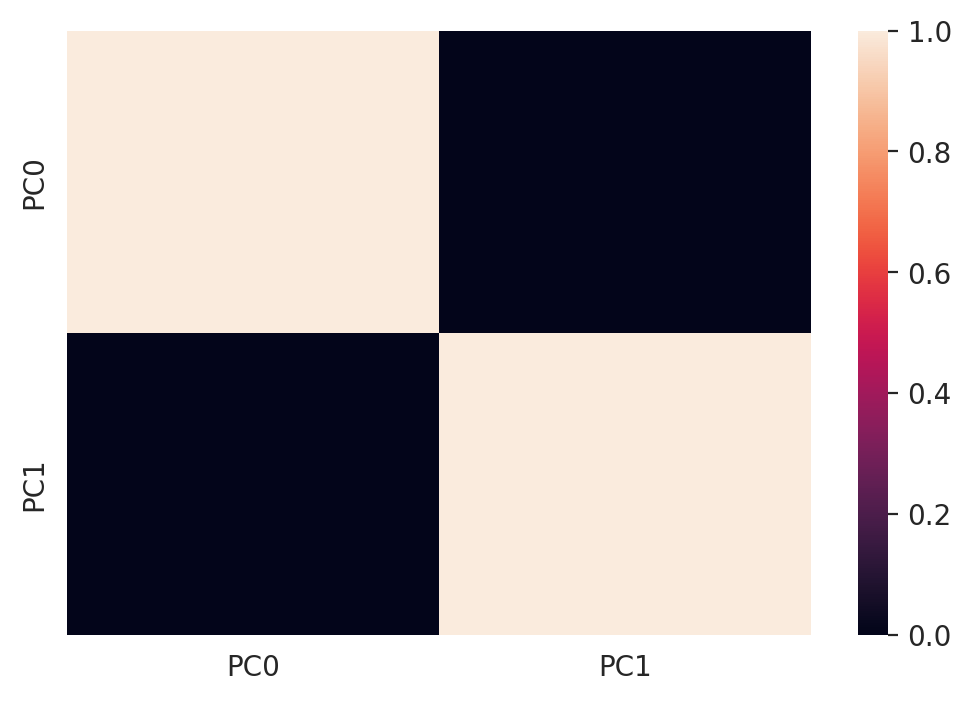

In [91]:
data_pca = pd.DataFrame(points_pca,columns=get_columns_with_pref('PC', num_components))
sns.heatmap(data_pca.corr())

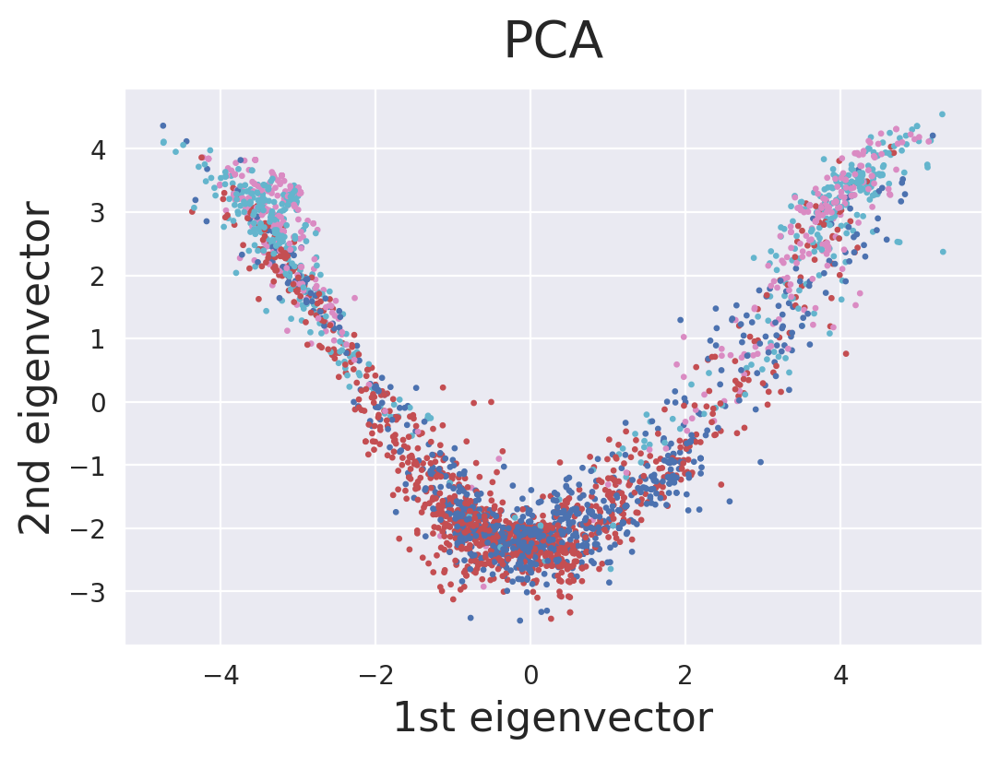

In [93]:
plot_iris_2d(
    x = data_pca['PC0'],
    y = data_pca['PC1'],
    title = 'PCA')
plt.savefig('./img' + '_PCA_' + '_' + 'resultImg_.png', format='png', dpi=600)

In [90]:
from sklearn.decomposition import PCA

num_components = 2

pca = PCA(n_components=num_components)
points_pca = pca.fit_transform(X)

In [14]:
from sklearn.manifold import TSNE

RANDOM_STATE = 42
tsne_n_components = 2
history_tsne = []

with warnings.catch_warnings():
        #tsne = TSNE(n_components=tsne_n_components, perplexity=40, n_iter=2000, random_state=RANDOM_STATE, method='exact')
        #tsne = TSNE(n_components=tsne_n_components, n_iter=5000, random_state=RANDOM_STATE, method='exact')
        tsne = TSNE(n_components=tsne_n_components, perplexity=40, n_iter=2000, random_state=RANDOM_STATE, method='barnes_hut')
        points = tsne.fit_transform(X)
history_tsne.append(points)

# for perplex in range(10, 100, 10):
#     with warnings.catch_warnings():
#         #tsne = TSNE(n_components=tsne_n_components, n_iter=5000, random_state=RANDOM_STATE, method='exact')
#         tsne = TSNE(n_components=tsne_n_components, perplexity=perplex, n_iter=2000, random_state=RANDOM_STATE, method='barnes_hut')
#         points = tsne.fit_transform(X)
#     history_tsne.append(points)

/opt/python/envs/default/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/python/envs/default/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [15]:
len(history_tsne[0])

2836

In [27]:
pd_tsneArray = []
for item in history_tsne:
    pd_tsneArray.append(pd.DataFrame(item ,columns=get_columns_with_pref('cl', tsne_n_components)))

<AxesSubplot:>

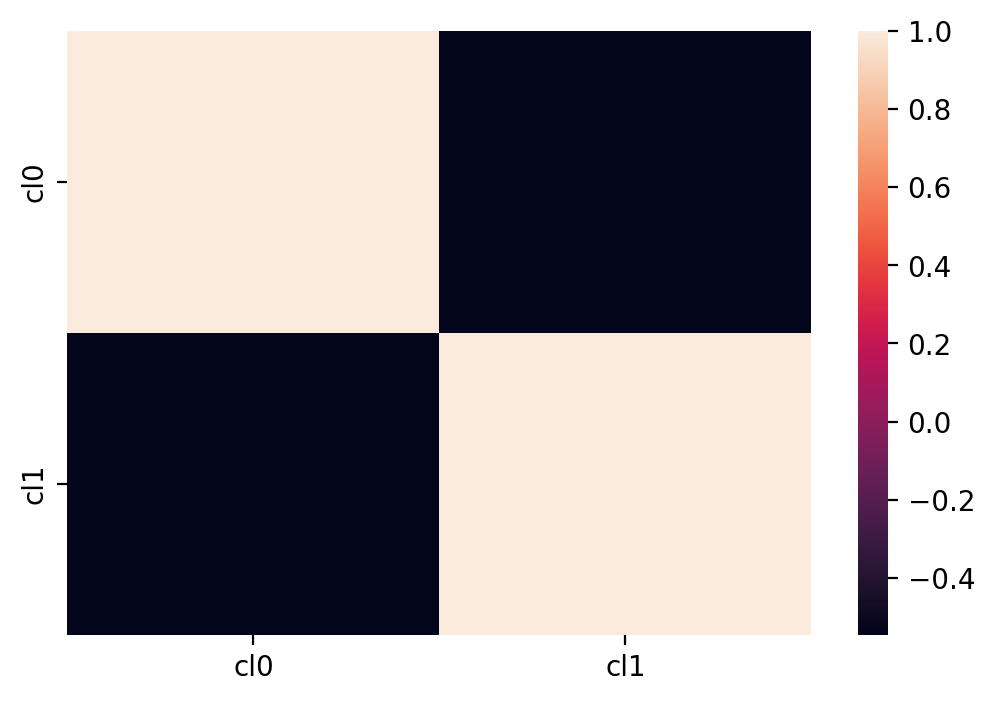

In [28]:
data_tsne = pd.DataFrame(points ,columns=get_columns_with_pref('cl', tsne_n_components))
sns.heatmap(data_tsne.corr())

In [29]:
data_tsne

,cl0,cl1
0,12.130108,-5.545631
1,3.898979,12.645661
2,25.285730,-68.763077
3,30.381769,-66.798637
4,30.892332,-66.746078
...,...,...
2831,16.999252,9.830797
2832,0.138082,20.701462
2833,-8.114445,16.834112
2834,-6.461681,17.265612


In [30]:
data_tsne.shape

(2836, 2)

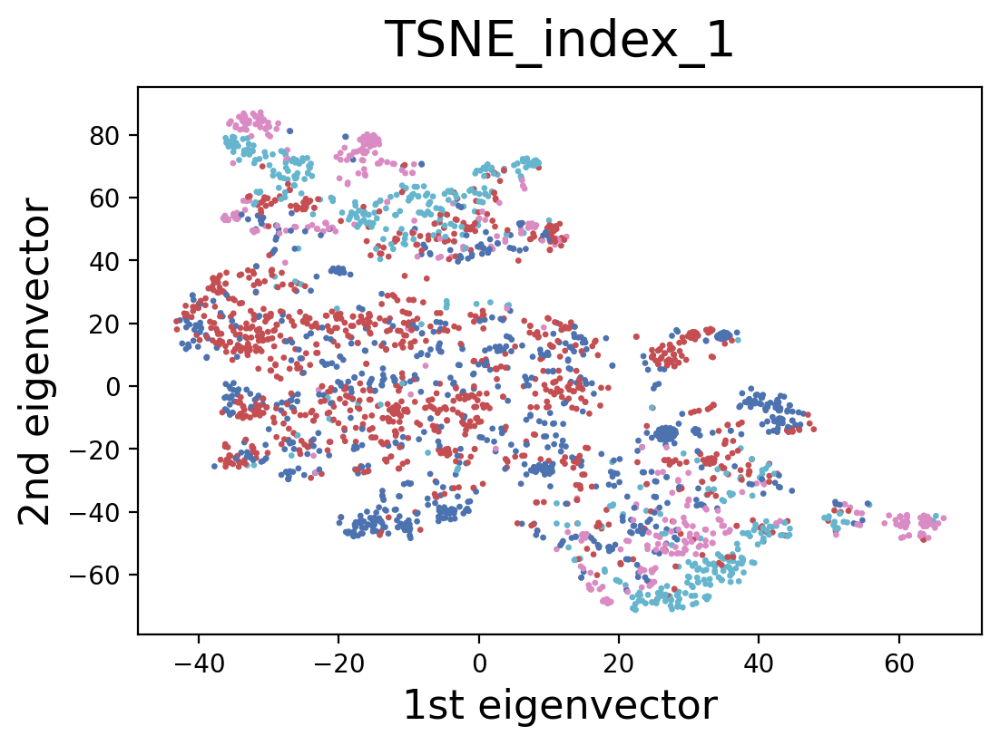

In [31]:
## 2d

plot_num = 1
# axes[0, 0]
for item in pd_tsneArray:
    plt.subplots(1, 1)
    plot_iris_2d(
        x = item['cl0'],
        y = item['cl1'],
        title = 'TSNE_index_' + str(plot_num))
    plot_num += 1
    #plt.savefig('./img' + str(plot_num) + '_t-sne_' + '_' + 'resultImg_.png', format='png', dpi=600)

In [ ]:
# 3d

In [91]:
from mpl_toolkits.mplot3d import Axes3D

def plot_iris_3d(x, y, z, title, c_in = Y_e):
    sns.set_style('whitegrid')
    
    fig = plt.figure(1, figsize=(8, 6))
    ax = Axes3D(fig, elev=-150, azim=110)
    
    ax.scatter(x, y, z,
               c=c_in,
               cmap=CMAP,
               s=2)
    
    ax.set_title(title, fontsize=20, y=1.03)
    
    fsize = 14
    ax.set_xlabel("1st eigenvector", fontsize=fsize)
    ax.set_ylabel("2nd eigenvector", fontsize=fsize)
    ax.set_zlabel("3rd eigenvector", fontsize=fsize)
    
    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])

In [20]:
## 3d

plot_num = 0
# axes[0, 0]
item = pd_tsneArray[plot_num]
plot_iris_3d(
x = item['cl0'],
y = item['cl1'],
z = item['cl2'],
title = 'TSNE')
plt.savefig('./img/' + str(plot_num) + '_t-sne_3d_' + '_' + 'resultImg_.png', format='png', dpi=600)
# for item in pd_tsneArray:
#     #display(item)
#     #plt.subplots(1, 1)
#     plot_iris_3d(
#     x = item['cl0'],
#     y = item['cl1'],
#     z = item['cl2'],
#     title = 'TSNE_index_' + str(plot_num))
#     plot_num += 1    

NameError: NameError: name 'pd_tsneArray' is not defined

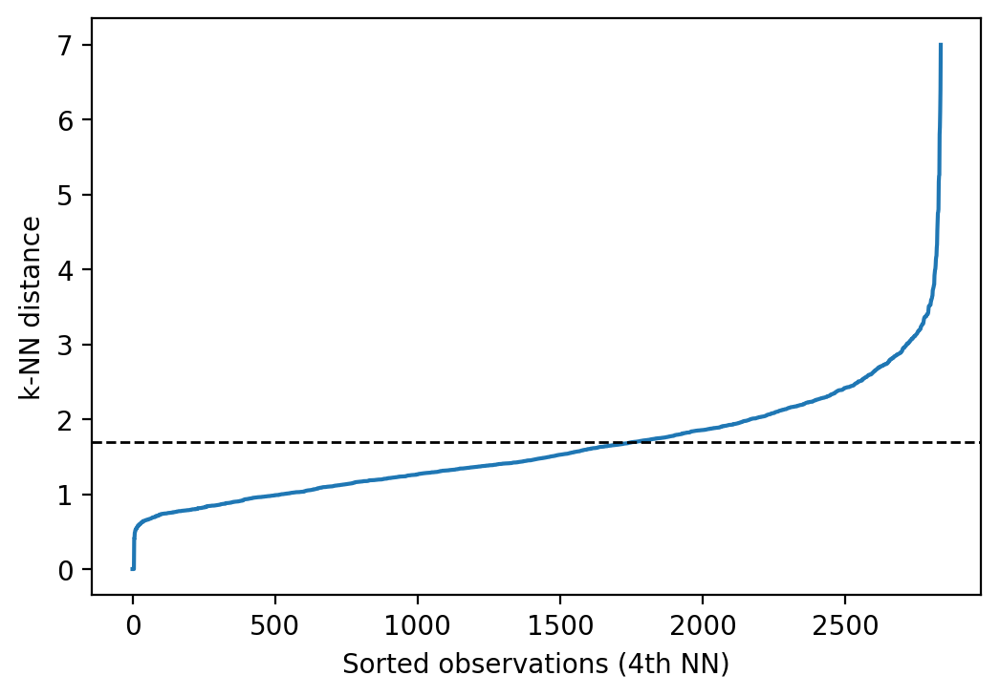

In [22]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
# n_neighbors = 5 as kneighbors function returns distance of point to itself (i.e. first column will be zeros) 
n_neighbors = 5
pointsNN = history_tsne[0]
nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(pointsNN)
# Find the k-neighbors of a point
neigh_dist, neigh_ind = nbrs.kneighbors(pointsNN)
# sort the neighbor distances (lengths to points) in ascending order
# axis = 0 represents sort along first axis i.e. sort along row
sort_neigh_dist = np.sort(neigh_dist, axis=0)

import matplotlib.pyplot as plt
k_dist = sort_neigh_dist[:, n_neighbors-1]
plt.plot(k_dist)
plt.axhline(y=1.7, linewidth=1, linestyle='dashed', color='k')
plt.ylabel("k-NN distance")
plt.xlabel("Sorted observations (4th NN)")
plt.show()

In [34]:
pointsCalc = history_tsne[0]

In [35]:
pointsCalc

array([[ 12.130108 , -5.545631 ],
 [ 3.8989787, 12.645661 ],
 [ 25.28573 , -68.76308 ],
 ...,
 [ -8.114445 , 16.834112 ],
 [ -6.461681 , 17.265612 ],
 [-21.798214 , 15.286596 ]], dtype=float32)

/opt/python/envs/default/lib/python3.8/site-packages/sklearn/cluster/_optics.py:904: RuntimeWarning: divide by zero encountered in divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

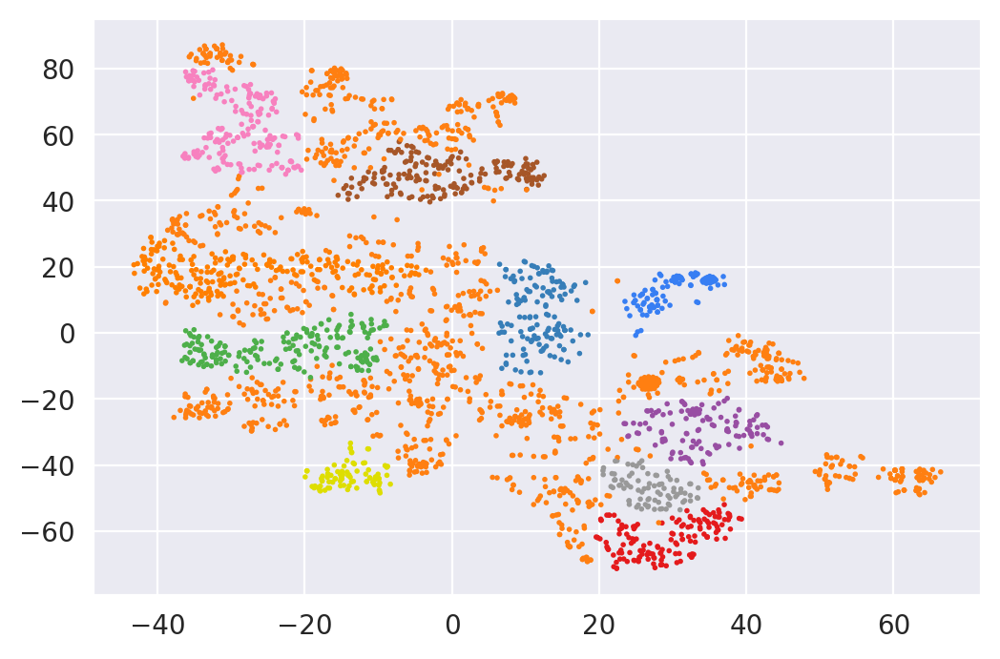

In [85]:
import warnings
from itertools import cycle, islice

#dbscan = cluster.DBSCAN(eps=3.3, min_samples=5)
dbscan = cluster.OPTICS(min_samples=5,
        xi=0.03,
        min_cluster_size=0.03,)

with warnings.catch_warnings():
    warnings.filterwarnings(
        "ignore",
        message="the number of connected components of the "
        + "connectivity matrix is [0-9]{1,2}"
        + " > 1. Completing it to avoid stopping the tree early.",
        category=UserWarning,
    )
    warnings.filterwarnings(
        "ignore",
        message="Graph is not fully connected, spectral embedding"
        + " may not work as expected.",
        category=UserWarning,
    )
    dbscan.fit(pointsCalc)

if hasattr(dbscan, "labels_"):
    y_pred = dbscan.labels_.astype(int)
else:
    y_pred = dbscan.predict(pointsCalc)

colors = np.array(
    list(
        islice(
            cycle(
                [
                    "#377eb8",
                    "#ff7f00",
                    "#4daf4a",
                    "#f781bf",
                    "#a65628",
                    "#984ea3",
                    "#999999",
                    "#e41a1c",
                    "#dede00",
                    "#377ef3",
                    "#ff7f11",
                    "#4daf43",
                    "#f78154",
                    "#a65676",
                    "#984e3a",
                    "#999944",
                    "#e41ac8",
                    "#dede39",
                    "#dede11",
                ]
            ),
            int(max(y_pred) + 1),
        )
    )
)

display(np.unique(dbscan.labels_))
plt.scatter(pointsCalc[:, 0], pointsCalc[:, 1], s=1, color=colors[y_pred])
#plt.xticks(())
#plt.yticks(())

#plt.show()

In [86]:
data_tsne['strategy'] = df['strategyOpponent']
display(data_tsne['strategy'].value_counts())

MiddleFieldSave      1070
MiddleFieldAttack     882
SaveNearGate          482
NearGateAttack        402
Name: strategy, dtype: int64

In [87]:
#df_process = pd.DataFrame(data_tsne)
df_process = pd.DataFrame(pd_tsneArray[0])
#df_process['strategy'] = df['strategyOpponent']#dbscan.labels_
df_process['strategy'] = dbscan.labels_
display(df_process['strategy'].value_counts())
df_process = df_process.drop(df_process[df_process['strategy'] == - 1].index)
display(df_process['strategy'].value_counts())

-1     1236
 1      247
 2      197
 3      192
 4      174
 7      153
 0      143
 5      122
 9      100
 10      98
 8       88
 6       86
Name: strategy, dtype: int64

1     247
2     197
3     192
4     174
7     153
0     143
5     122
9     100
10     98
8      88
6      86
Name: strategy, dtype: int64

In [88]:
display(len(df_process.value_counts(df_process['strategy'])))
df_process.value_counts(df_process['strategy'])

11

strategy
1 247
2 197
3 192
4 174
7 153
0 143
5 122
9 100
10 98
8 88
6 86
dtype: int64

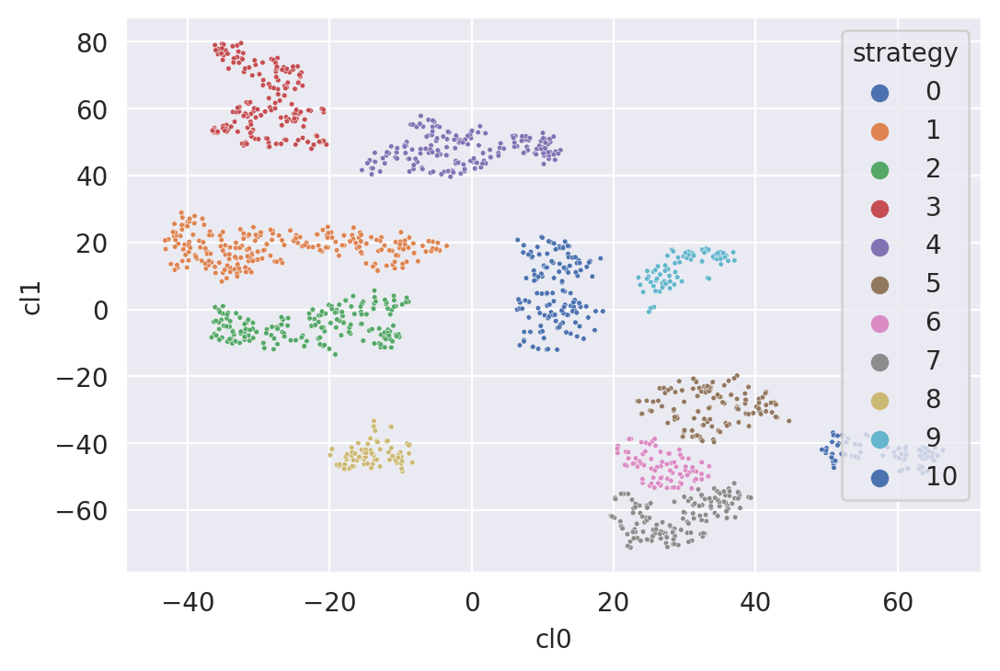

In [94]:
sns.scatterplot(data=df_process, x="cl0", y="cl1", hue="strategy", s=4, palette='deep')
plt.savefig('./img/' + str(plot_num) + '_optics_' + '_' + 'resultImg_.png', format='png', dpi=600)

<ipython-input-91-a2e4ae897413>:7: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig, elev=-150, azim=110)


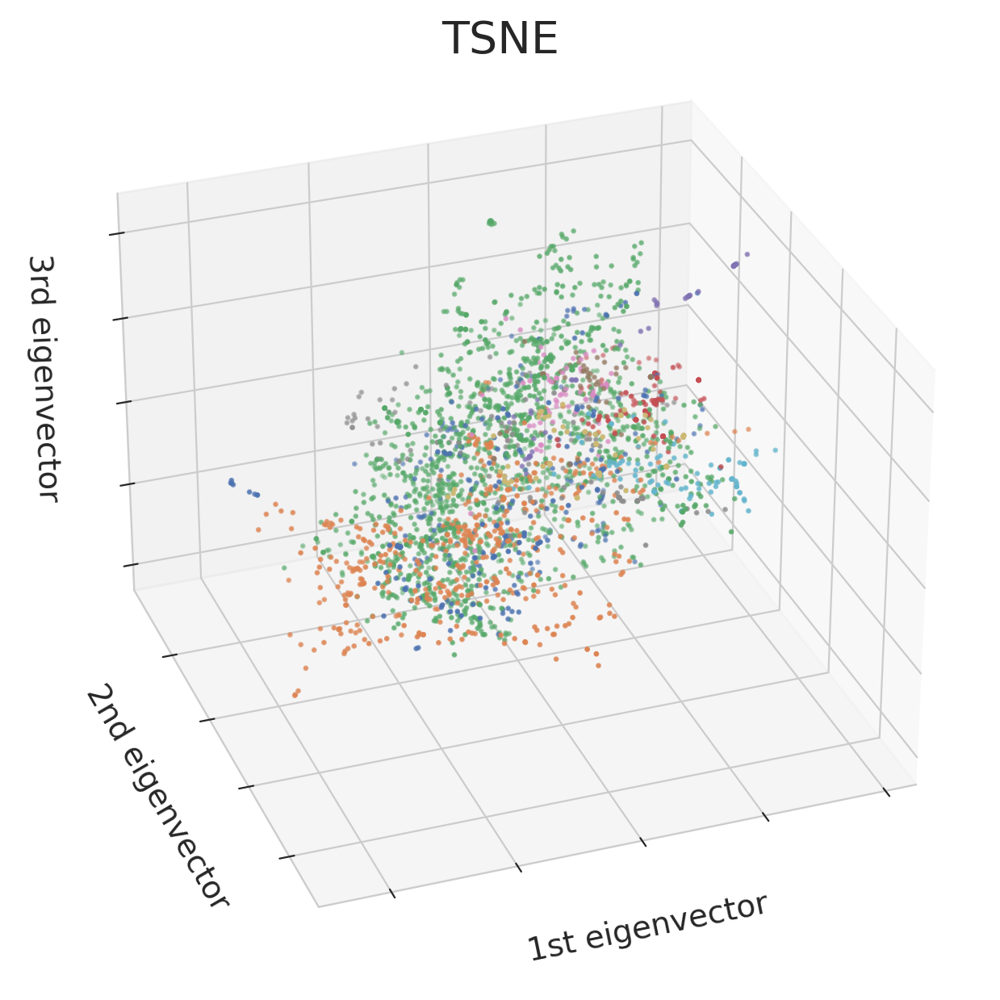

In [148]:
plot_iris_3d(
x = df_process['cl0'],
y = df_process['cl1'],
z = df_process['cl2'],
title = 'TSNE', c_in=df_process['strategy'])
plt.savefig('./img/' + str(plot_num) + '_dbscan_3d_' + '_' + 'resultImg_.png', format='png', dpi=600)

In [12]:
Y_d_test.shape

(399, 2)

In [ ]:
# Обучение без учителя

from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(df_process, df_process['strategy'], test_size=0.1, random_state=42)

In [61]:
# Обучение с учителем и с сжатием данных

from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(data_tsne, data_tsne['strategy'], test_size=0.1, random_state=42)

In [17]:
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(df, df['strategyOpponent'], test_size=0.1, random_state=42)

In [64]:
x_train

,cl0,cl1,cl2,cl3,cl4,cl5,cl6,cl7,cl8,cl9,cl10,cl11,cl12,cl13,cl14,strategy
1099,0.415570,-1.503457,-0.289649,1.189761,0.992466,-2.807703,-0.126240,-0.600818,0.602429,-0.834504,-1.379961,0.237517,-2.527492,1.109628,0.572601,NearGateAttack
2686,0.123241,-0.039529,0.022567,-0.504668,1.088578,-0.303656,0.413646,1.563804,0.369339,0.908945,1.080866,0.115852,-0.890164,1.237991,-0.250889,MiddleFieldAttack
2133,-1.117568,0.187099,0.961043,0.454079,-0.087455,1.872000,0.407410,0.369118,0.029739,-0.224767,1.034532,-0.012430,-0.432554,0.102773,-0.431215,MiddleFieldSave
1234,1.352344,-0.758753,0.302287,0.000407,0.367909,0.186237,0.068317,0.308607,-0.276787,0.474370,0.673433,-0.269326,1.309428,-1.078116,0.248753,MiddleFieldAttack
29,-0.286079,0.564286,0.016085,0.536241,-1.680283,-0.283963,0.179504,-0.723822,0.394428,0.545600,-1.778338,0.136357,0.444470,-0.786629,-0.167149,MiddleFieldAttack
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1638,-1.007093,0.627183,0.553491,-0.673308,-1.027663,1.055378,0.001644,0.433015,-0.167191,-0.016413,0.717981,-1.165963,0.615274,-1.731475,0.091818,MiddleFieldAttack
1095,1.279347,-0.474098,0.226428,0.676706,-0.139134,0.664429,-0.589566,0.720602,-0.530416,1.279820,0.518893,-0.604104,0.189608,-0.410408,-0.216067,MiddleFieldSave
1130,0.617925,-0.963481,0.525387,1.964996,0.520928,-0.085413,0.368313,-0.009333,-0.037083,0.243497,-0.700109,0.528557,-1.454797,0.178619,-1.025797,MiddleFieldAttack
1294,0.150416,0.612384,-0.048015,-2.553034,0.584130,3.071246,1.517055,2.489071,-0.935878,0.148762,3.934738,-1.382840,2.199552,-1.743749,1.662580,NearGateAttack


In [62]:
x_train.shape

(2552, 16)

In [65]:
# Обучение без учителя

x_train = x_train.drop('strategy', axis=1)
x_val = x_val.drop('strategy', axis=1)

In [21]:
x_train = x_train.drop('strategyOpponent', axis=1)
x_val = x_val.drop('strategyOpponent', axis=1)

In [66]:
Y_e = encoder.fit_transform(y_train.values)
Y_d = keras.utils.to_categorical(Y_e)

Y_e_test = encoder.fit_transform(y_val.values)
Y_d_test = keras.utils.to_categorical(Y_e_test)

X = x_train.values
XTest = x_val.values

In [67]:
Y_d

array([[0., 0., 1., 0.],
 [1., 0., 0., 0.],
 [0., 1., 0., 0.],
 ...,
 [1., 0., 0., 0.],
 [0., 0., 1., 0.],
 [0., 0., 1., 0.]], dtype=float32)

In [68]:
Y_d_test.shape

(284, 4)

In [69]:
X.shape

(2552, 15)

In [70]:
value_tactic = 4
model = keras.models.Sequential([
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(value_tactic, activation='sigmoid')
])
model.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X, Y_d, epochs=5, batch_size=10, validation_split=0.1, verbose=1)
score = model.evaluate(XTest, Y_d_test)

Epoch 1/5
230/230 [==============================] - 1s 3ms/step - loss: 1.4202 - accuracy: 0.3502 - val_loss: 1.1818 - val_accuracy: 0.4844
Epoch 2/5
230/230 [==============================] - 0s 2ms/step - loss: 1.1281 - accuracy: 0.5335 - val_loss: 1.0311 - val_accuracy: 0.5273
Epoch 3/5
230/230 [==============================] - 0s 2ms/step - loss: 1.0106 - accuracy: 0.5819 - val_loss: 0.9437 - val_accuracy: 0.5898
Epoch 4/5
230/230 [==============================] - 0s 2ms/step - loss: 0.9362 - accuracy: 0.6089 - val_loss: 0.8887 - val_accuracy: 0.6328
Epoch 5/5
9/9 [==============================] - 0s 1ms/step - loss: 0.8253 - accuracy: 0.6690


In [71]:
#score
print("Точность обучения: {0:.2%}".format(score[1]))

Точность обучения: 66.90%


In [164]:
#history_hidden = model.fit(XHidden, Y_d_hidden, epochs=5, batch_size=10, validation_split=0.1, verbose=1)

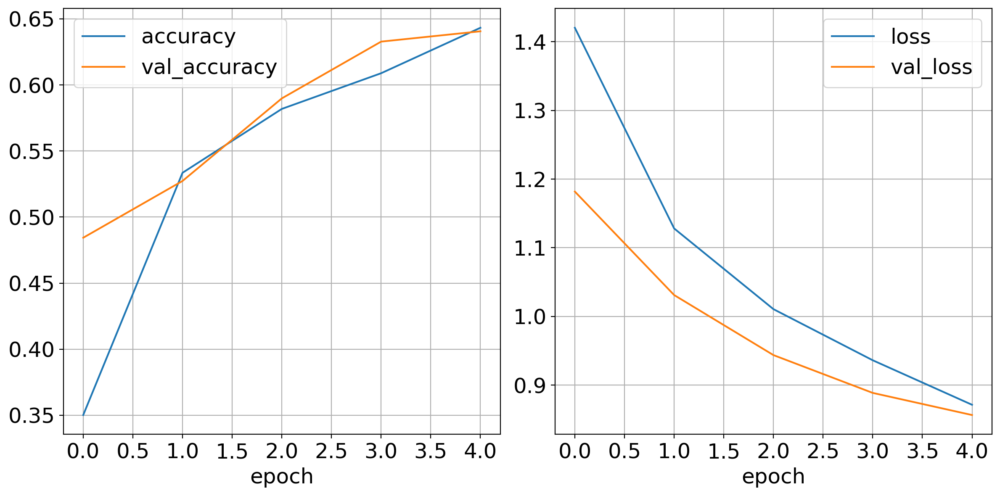

In [72]:
def plot_history(history, ax1=None, ax2=None, nameSave = None):
    df_h = pd.DataFrame(history.history)
    if ax1 is None:
        _, [ax1, ax2] = plt.subplots(1, 2, figsize=(12, 6))
    df_h[['accuracy', 'val_accuracy']].plot(ax=ax1, fontsize=18)
    df_h[['loss', 'val_loss']].plot(ax=ax2, fontsize=18)
    for ax in [ax1, ax2]:
        ax.legend(fontsize=18)
        ax.set_xlabel('epoch', fontsize=18)
        #ax.rc(fontsize=20)
        ax.grid(0.75)
        ax.set_axisbelow(True)

    if nameSave:
        plt.savefig(nameSave, format='png', dpi=600)

plot_history(history)
plt.gcf().tight_layout()
#plt.savefig('h0.png')

In [73]:
from sklearn.model_selection import KFold

In [74]:
X.shape

(2552, 15)

In [75]:
max_review_op_length

48

In [82]:

kf = KFold(n_splits=5, shuffle=True, random_state=42)

histories = []
scores = []
neyron = 15#max_review_op_length+1
#neyron = max_review_op_length+1

for train_index, test_index in kf.split(X, Y_d):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y_d[train_index], Y_d[test_index]
    model = keras.models.Sequential([
        keras.layers.Dense(neyron, activation='relu'),
        keras.layers.Dropout(0.2, noise_shape=None, seed=None),
        keras.layers.Dense(neyron * 2, activation='relu'),
        keras.layers.Dropout(0.15, noise_shape=None, seed=None),
        keras.layers.Dense(neyron / 3, activation='relu'),
        keras.layers.Dense(value_tactic, activation='softmax')
    ])
    model.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train, Y_train, epochs=500, batch_size=1000, verbose=1, validation_data=(X_test, Y_test))
    score = model.evaluate(XTest, Y_d_test, verbose=0)
    #print("Точность обучения: {0:.2%}".format(score[1]))
    scores.append(score)
    histories.append(history)

Epoch 1226/1500
3/3 [==============================] - 0s 13ms/step - loss: 0.7013 - accuracy: 0.7125 - val_loss: 0.7304 - val_accuracy: 0.6980
Epoch 1227/1500
3/3 [==============================] - 0s 12ms/step - loss: 0.6873 - accuracy: 0.7209 - val_loss: 0.7300 - val_accuracy: 0.7039
Epoch 1228/1500
3/3 [==============================] - 0s 13ms/step - loss: 0.6867 - accuracy: 0.7130 - val_loss: 0.7294 - val_accuracy: 0.7020
Epoch 1229/1500
3/3 [==============================] - 0s 12ms/step - loss: 0.6944 - accuracy: 0.7287 - val_loss: 0.7308 - val_accuracy: 0.7000
Epoch 1230/1500
3/3 [==============================] - 0s 13ms/step - loss: 0.6941 - accuracy: 0.7145 - val_loss: 0.7344 - val_accuracy: 0.6941
Epoch 1231/1500
3/3 [==============================] - 0s 12ms/step - loss: 0.7018 - accuracy: 0.7169 - val_loss: 0.7368 - val_accuracy: 0.6941
Epoch 1232/1500
3/3 [==============================] - 0s 12ms/step - loss: 0.6820 - accuracy: 0.7214 - val_loss: 0.7384 - val_accuracy:

In [83]:
for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 73.24%
Точность обучения: 76.76%
Точность обучения: 72.89%
Точность обучения: 76.41%
Точность обучения: 72.54%


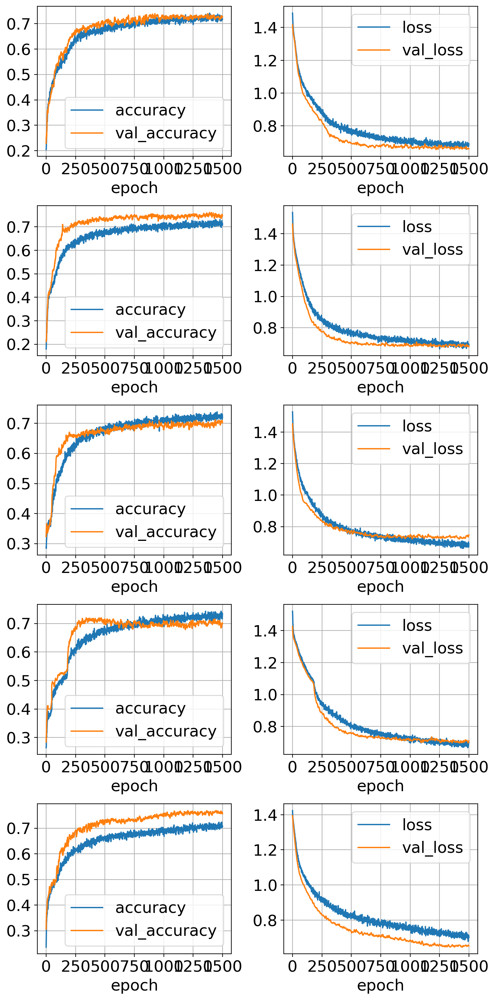

In [84]:
# Тест к сжатым данным и размеченным к обучению с учителем

fig, axes = plt.subplots(5, 2, figsize=(8, 16))

indexT = 1

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    #plot_history(history, ax1, ax2, './img/' + str(plot_num) + '_model_2_' + '_' + str(indexT) + '_resultImg_.png')
    #plt.savefig('./img/' + str(plot_num) + '_model_2_' + '_' + str(indexT) + '_resultImg_.png', format='png', dpi=600)
    indexT += 1
    
fig.tight_layout()

In [121]:
for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 92.91%
Точность обучения: 93.97%
Точность обучения: 92.91%
Точность обучения: 92.55%
Точность обучения: 91.49%


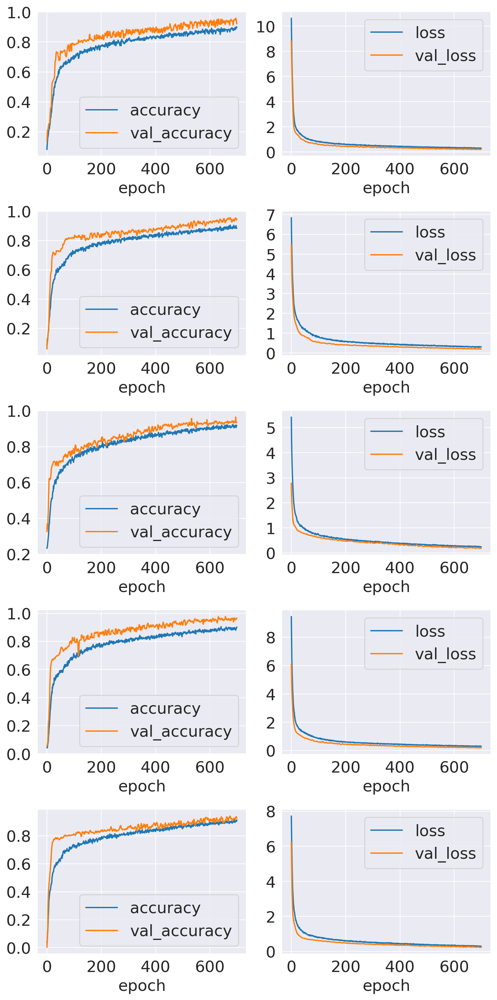

In [120]:
# Тест к сжатым данным и разделённым без учителя

fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()

In [117]:
for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 90.43%
Точность обучения: 88.65%
Точность обучения: 92.55%
Точность обучения: 89.01%
Точность обучения: 90.07%


In [42]:
# 2 стрратегии после мёрджа
# Точность обучения: 81.20%
# Точность обучения: 83.71%
# Точность обучения: 82.46%
# Точность обучения: 80.95%
# Точность обучения: 82.21%

# sigmoid
# Точность обучения: 81.95%
# Точность обучения: 80.70%
# Точность обучения: 80.45%
# Точность обучения: 81.95%
# Точность обучения: 81.70%

# softmax (3 hidden layers)
# Точность обучения: 83.71%
# Точность обучения: 78.45%
# Точность обучения: 80.45%
# Точность обучения: 82.96%
# Точность обучения: 82.21%

# softmax (1 hidden layers - 400 эпох)
# Точность обучения: 83.46%
# Точность обучения: 82.46%
# Точность обучения: 82.96%
# Точность обучения: 81.70%
# Точность обучения: 83.46%
for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 77.94%
Точность обучения: 82.46%
Точность обучения: 80.70%
Точность обучения: 80.70%
Точность обучения: 79.70%


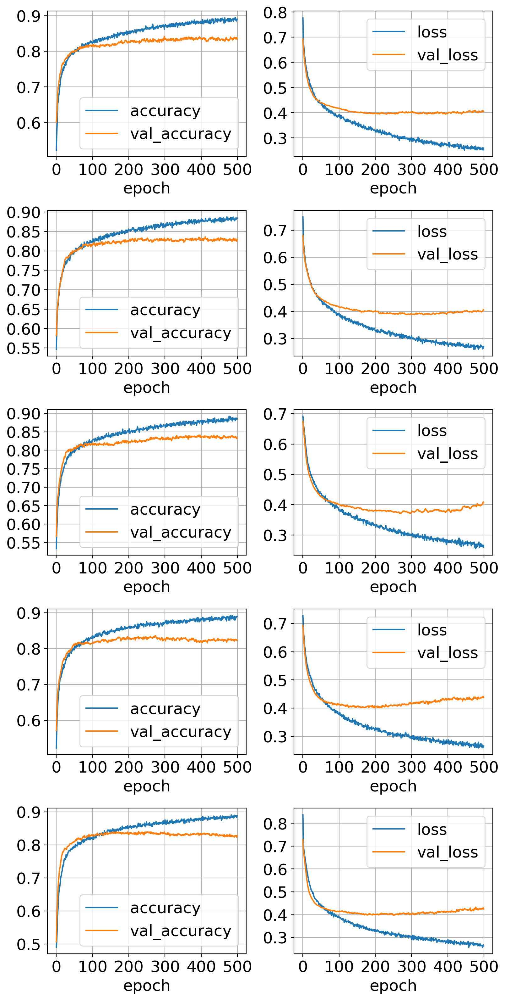

In [87]:
# Точность обучения: 81.45%
# Точность обучения: 80.70%
# Точность обучения: 77.69%
# Точность обучения: 80.70%
# Точность обучения: 82.21%

# Доп слой
# Точность обучения: 81.45%
# Точность обучения: 82.46%
# Точность обучения: 78.95%
# Точность обучения: 83.21%
# Точность обучения: 79.70%

fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()
#fig.savefig('h1.png')

In [143]:
# 5 стрратегий
for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 59.12%
Точность обучения: 60.59%
Точность обучения: 59.71%
Точность обучения: 61.18%
Точность обучения: 57.65%


In [114]:
# Три стратегии

# 200 batch и 150 итераций
# Точность обучения: 75.21%
# Точность обучения: 70.74%
# Точность обучения: 74.38%
# Точность обучения: 74.21%
# Точность обучения: 75.04%

# 250 стратегий  900 батч
# Точность обучения: 74.38%
# Точность обучения: 69.59%
# Точность обучения: 73.06%
# Точность обучения: 76.69%
# Точность обучения: 76.36%

for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 74.21%
Точность обучения: 71.74%
Точность обучения: 74.55%
Точность обучения: 74.21%
Точность обучения: 75.70%


In [119]:
# Две стратегии
# При конфигурации 400 эпох, скрытый слой:
#keras.layers.Dropout(0.2, noise_shape=None, seed=None),
#       keras.layers.Dense(20, activation='relu'),
# 79.89%
# Точность обучения: 79.89%
# Точность обучения: 74.66%
# Точность обучения: 78.51%
# Точность обучения: 80.17%

for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 75.70%
Точность обучения: 72.23%
Точность обучения: 74.88%
Точность обучения: 75.04%
Точность обучения: 71.90%


In [42]:
# Точность epochs=150, batch_size=20 и слой как выше в первом
# Точность обучения: 80.17%
# Точность обучения: 78.51%
# Точность обучения: 73.28%
# Точность обучения: 79.61%
# Точность обучения: 76.03%
for scoreItem in scores:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 76.31%
Точность обучения: 76.58%
Точность обучения: 85.12%
Точность обучения: 81.82%
Точность обучения: 73.83%


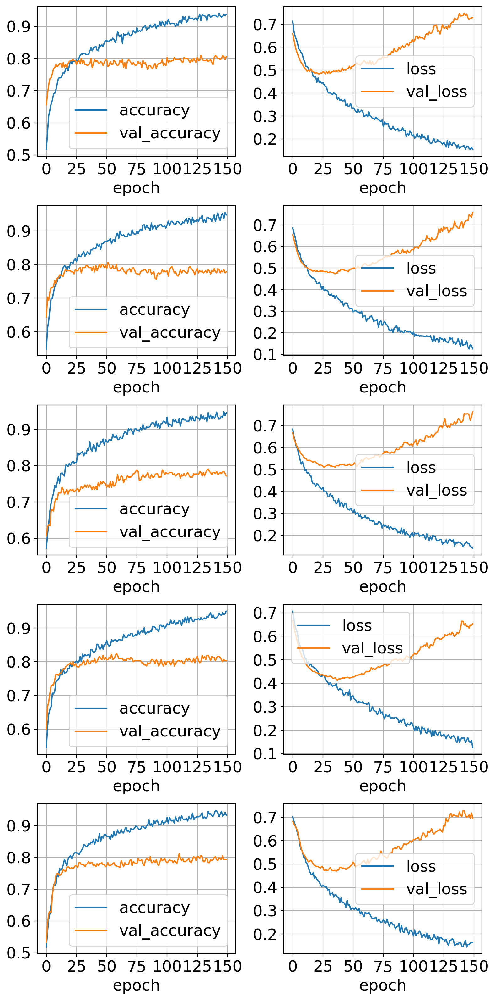

In [23]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()
#fig.savefig('h1.png')

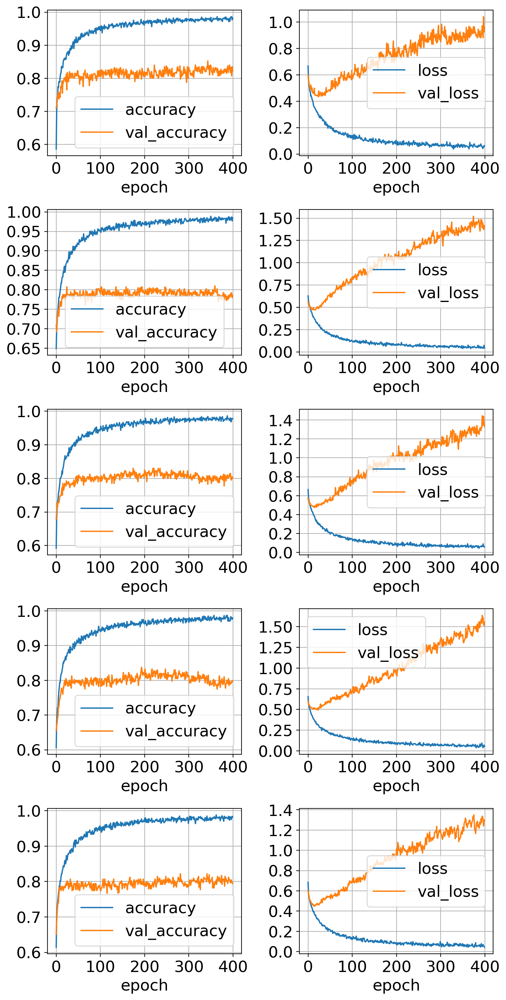

In [17]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()
#fig.savefig('h1.png')

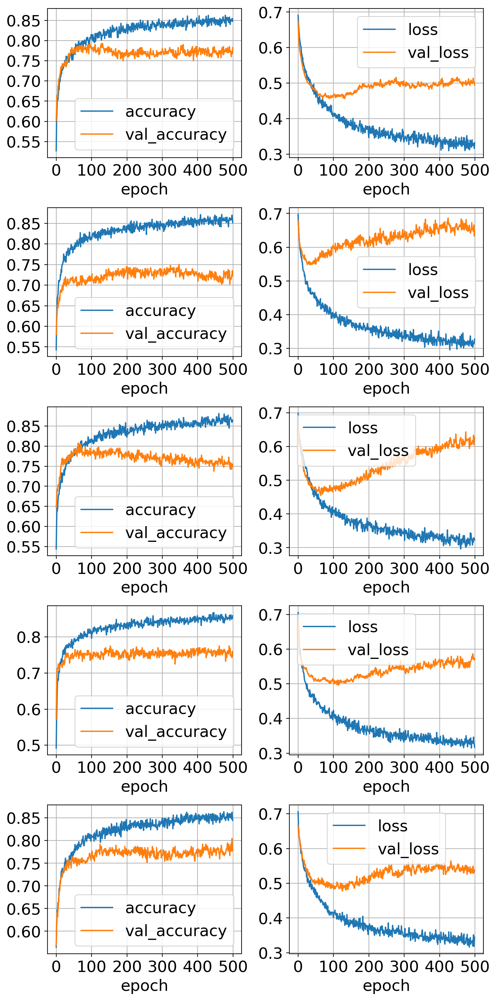

In [38]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()
#fig.savefig('h1.png')

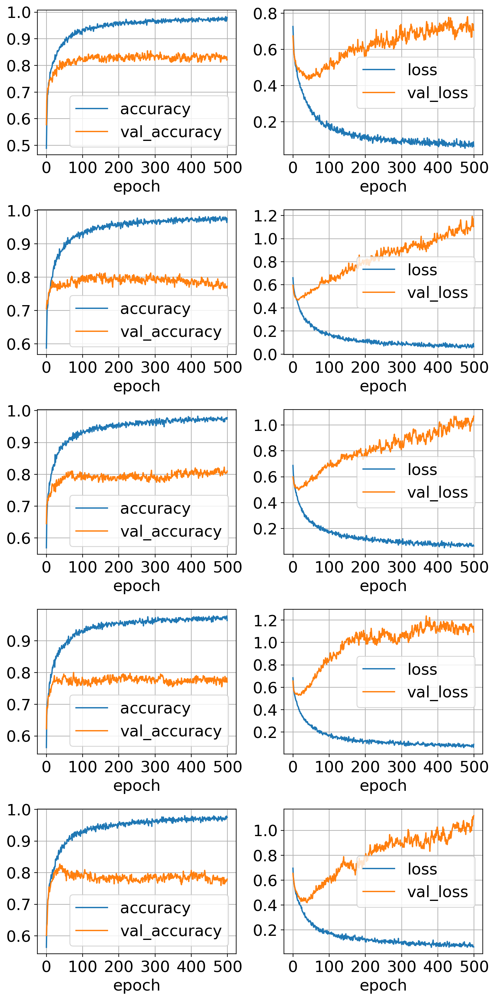

In [30]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()
#fig.savefig('h1.png')

In [12]:
histories_hidden = []
scores = []

for train_index, test_index in kf.split(XHidden, Y_d_hidden):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y_d[train_index], Y_d[test_index]
    model = keras.models.Sequential([
        keras.layers.Dense(max_review_length, activation='relu'),
        keras.layers.Dense(25, activation='relu'),
        keras.layers.Dense(15, activation='relu'),
        keras.layers.Dense(value_tactic, activation='softmax')
    ])
        score = model.evaluate(XTest, Y_d_test, verbose=0)
    #print("Точность обучения: {0:.2%}".format(score[1]))
    scores.append(score)
    model.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train, Y_train, epochs=75, batch_size=10, verbose=1, validation_data=(X_test, Y_test))
    histories.append(history)

Epoch 1/75
86/86 [==============================] - 1s 6ms/step - loss: 2.3833 - accuracy: 0.1559 - val_loss: 2.2388 - val_accuracy: 0.2056
Epoch 2/75
86/86 [==============================] - 0s 2ms/step - loss: 2.0954 - accuracy: 0.2661 - val_loss: 1.9464 - val_accuracy: 0.3411
Epoch 3/75
86/86 [==============================] - 0s 2ms/step - loss: 1.7899 - accuracy: 0.4490 - val_loss: 1.7033 - val_accuracy: 0.4159
Epoch 4/75
86/86 [==============================] - 0s 2ms/step - loss: 1.5634 - accuracy: 0.5193 - val_loss: 1.5365 - val_accuracy: 0.4766
Epoch 5/75
86/86 [==============================] - 0s 2ms/step - loss: 1.3900 - accuracy: 0.5498 - val_loss: 1.4096 - val_accuracy: 0.5374
Epoch 6/75
86/86 [==============================] - 0s 3ms/step - loss: 1.2555 - accuracy: 0.6014 - val_loss: 1.3529 - val_accuracy: 0.5607
Epoch 7/75
86/86 [==============================] - 0s 2ms/step - loss: 1.1722 - accuracy: 0.6131 - val_loss: 1.2946 - val_accuracy: 0.5607
Epoch 8/75
86/86 [==

In [13]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories_hidden, axes):
    plot_history(history, ax1, ax2)
    
fig.tight_layout()
#fig.savefig('h1_hidden.png')

In [135]:
def eval_histories(histories):
    data = []
    for history in histories:
        datum = {}
        for k, v in history.history.items():
            datum[k] = v[-1]
        data.append(datum)
    df_e = pd.DataFrame(data)
    df_e.loc['mean'] = df_e.mean()
    return df_e

df_e = eval_histories(histories)

df_e

,loss,accuracy,val_loss,val_accuracy
0,9.205349e-05,1.0,2.031639,0.832500
1,6.100711e-05,1.0,4.061638,0.760000
2,6.781258e-07,1.0,3.031691,0.802500
3,4.931627e-07,1.0,3.653501,0.777500
4,5.934406e-06,1.0,3.819283,0.771930
mean,3.203326e-05,1.0,3.319551,0.788886


In [144]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

histories_2 = []
scores_2 = []

for train_index, test_index in kf.split(X, Y_d):
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y_d[train_index], Y_d[test_index]
    model = keras.models.Sequential([
        keras.layers.Dense(max_review_length, activation='relu'),
        keras.layers.Dense(25, activation='relu'),
        keras.layers.Dense(25, activation='relu'),
        keras.layers.Dense(15, activation='relu'),
        keras.layers.Dense(value_tactic, activation='softmax')
    ])
    model.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train, Y_train, epochs=350, batch_size=10, verbose=1, validation_data=(X_test, Y_test))
    scoreT = model.evaluate(XTest, Y_d_test, verbose=0)
    #print("Точность обучения: {0:.2%}".format(score[1]))
    scores_2.append(scoreT)
    histories_2.append(history)

Epoch 80/350
160/160 [==============================] - 0s 2ms/step - loss: 2.6621e-05 - accuracy: 1.0000 - val_loss: 2.1717 - val_accuracy: 0.7900
Epoch 81/350
160/160 [==============================] - 0s 2ms/step - loss: 2.3643e-05 - accuracy: 1.0000 - val_loss: 2.1933 - val_accuracy: 0.7900
Epoch 82/350
160/160 [==============================] - 0s 2ms/step - loss: 2.1284e-05 - accuracy: 1.0000 - val_loss: 2.2153 - val_accuracy: 0.7900
Epoch 83/350
160/160 [==============================] - 0s 2ms/step - loss: 1.9054e-05 - accuracy: 1.0000 - val_loss: 2.2366 - val_accuracy: 0.7900
Epoch 84/350
160/160 [==============================] - 0s 2ms/step - loss: 1.7559e-05 - accuracy: 1.0000 - val_loss: 2.2623 - val_accuracy: 0.7925
Epoch 85/350
160/160 [==============================] - 0s 2ms/step - loss: 1.5482e-05 - accuracy: 1.0000 - val_loss: 2.2868 - val_accuracy: 0.7925
Epoch 86/350
160/160 [==============================] - 0s 2ms/step - loss: 1.4112e-05 - accuracy: 1.0000 - val_

In [145]:
for scoreItem in scores_2:
    print("Точность обучения: {0:.2%}".format(scoreItem[1]))
    #print(scoreItem)

Точность обучения: 75.76%
Точность обучения: 73.83%
Точность обучения: 79.06%
Точность обучения: 77.41%
Точность обучения: 77.69%


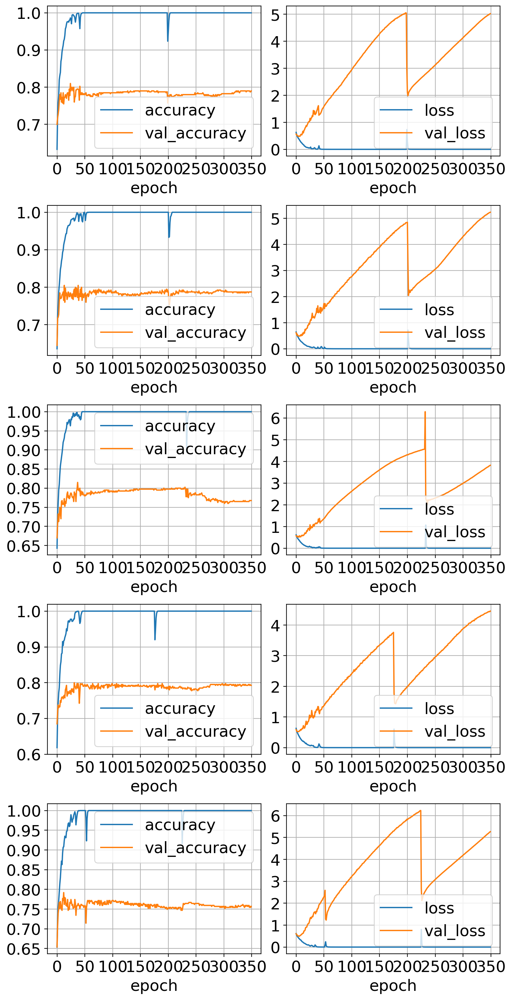

In [146]:
fig, axes = plt.subplots(5, 2, figsize=(8, 16))

for history, [ax1, ax2] in zip(histories_2, axes):
    plot_history(history, ax1, ax2)
    
    
fig.tight_layout()
# fig.savefig('img/h2.png')